This notebook contains the code and outputs for my final project for Applied Deep Learning from the Fall semester of 2022, part of my Master's in Data Science program from Columbia Univrsity (preceded by the course's description of the project and starter code). Please note that this notebook is not maintained and therefore may not run if one attempts to run it. A full video walkthrough of the code and results may be found here: https://youtu.be/2V2Ql1zaNHw

## About

This starter code shows how to read slides and tumor masks from the [CAMELYON16](https://camelyon17.grand-challenge.org/Data/) dataset. It will install [OpenSlide](https://openslide.org/) in Colab (the only non-Python dependency). Note that OpenSlide also includes a [DeepZoom viewer](https://github.com/openslide/openslide-python/tree/master/examples/deepzoom), shown in class. To use that, you'll need to install and run OpenSlide locally on your computer.

### Training data

The original slides and annotations are in an unusual format. I converted a bunch of them for you, so you can read them with OpenSlide as shown in this notebook. These will be uploaded for you the week of Oct 24th, at which point we'll update this notebook with a link. 

**Update:** This Google Drive [folder](https://drive.google.com/drive/folders/11GEhOPP0T4Oaw_Yhb4jD_fh79DNXq8no?usp=sharing) contains many additional slides and masks you can use. Note that while the starter code below downloads one slide from a Google Cloud URL (we have hosted this online for you for convenience), you will need to find a way to work with the other slides yourself for practice. You do not need to use them all! Just a few. You can either host the slides you'll use on Cloud storage using any provider, or you can download from Google Drive in your notebook (this may be slow).

Note that even with the starter code, it will take some effort to understand how to work with this data (the various zoom levels, and the coordinate system).

### Goals and grading

The goal for your project is to build a thoughtful, end-to-end prototype - not to match the accuracy from the [paper](https://arxiv.org/abs/1703.02442), and not necessarily to use all the available data. To receive an A on this work, your project should (for example):
- Use multiple zoom levels
- Use high-magnification images
- Include several visualizations of your results (both heatmaps showing predictions on individual slides, and other metrics/diagrams you design that are appropriate to communicate how well your model performs).

You are also welcome to propose a custom project of similar scope, on any topic of interest to you.

In [1]:
# NOTES
# RESULTS NOT IMPROVED FOR UP TO 4 LEVELS OF MAGNIFICATION - THEY USE JUST 2
# PATCHES HAVE 128x128 "CENTER REGIONS"

In [2]:
# Install the OpenSlide C library and Python bindings
# After installing these libraries, use `Runtime -> restart and run all` on the menu
!apt-get install openslide-tools
!pip install openslide-python

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  libopenslide0
Suggested packages:
  libtiff-tools
The following NEW packages will be installed:
  libopenslide0 openslide-tools
0 upgraded, 2 newly installed, 0 to remove and 20 not upgraded.
Need to get 92.5 kB of archives.
After this operation, 268 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libopenslide0 amd64 3.4.1+dfsg-2 [79.8 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 openslide-tools amd64 3.4.1+dfsg-2 [12.7 kB]
Fetched 92.5 kB in 1s (115 kB/s)
Selecting previously unselected package libopenslide0.
(Reading database ... 124016 files and directories currently installed.)
Preparing to unpack .../libopenslide0_3.4.1+dfsg-2

In [3]:
# IMPORT PACKAGES
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from openslide import open_slide, __library_version__ as openslide_version
import os
from PIL import Image
from skimage.color import rgb2gray
import pandas as pd
import tensorflow as tf
import IPython.display as display
import random as rand
import time
from sklearn.model_selection import train_test_split
from google.cloud import storage
import re
from tensorflow.keras import backend as K
import gc

In [4]:
# Download an example slide and tumor mask

# Note: the remainder of the training data are in the Google Drive folder linked above.
# You will need to host them on your own, either in Google Drive, or by using
# the cloud provider of your choice.

# LIST OF SELECTED SLIDES FOR PROJECT
slide_paths = ['tumor_078.tif', 'tumor_094.tif', 'tumor_075.tif', 'tumor_081.tif', 'tumor_084.tif']
# AND CORRESPONDING MASKS
tumor_mask_paths = ['tumor_078_mask.tif', 'tumor_094_mask.tif', 'tumor_075_mask.tif', 'tumor_081_mask.tif', 'tumor_084_mask.tif'] 

# CREATE LISTS OF FULL URLS FOR SLIDES/MASKS
slide_urls = []
for slide_path in slide_paths:
  slide_url = 'https://storage.googleapis.com/george-reynolds-applied-dl-final-project-slides/{}'.format(slide_path)
  slide_urls.append(slide_url)

mask_urls = []
for tumor_mask_path in tumor_mask_paths:
  mask_url = 'https://storage.googleapis.com/george-reynolds-applied-dl-final-project-slides/{}'.format(tumor_mask_path)
  mask_urls.append(mask_url)


for slide_path, slide_url in zip(slide_paths, slide_urls):
  # Download the whole slide image
  if not os.path.exists(slide_path):
    !curl -O $slide_url

for tumor_mask_path, mask_url in zip(tumor_mask_paths, mask_urls):
  # Download the tumor mask
  if not os.path.exists(tumor_mask_path):
    !curl -O $mask_url


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1626M  100 1626M    0     0  98.5M      0  0:00:16  0:00:16 --:--:--  101M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1534M  100 1534M    0     0  70.1M      0  0:00:21  0:00:21 --:--:-- 75.6M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  893M  100  893M    0     0  93.6M      0  0:00:09  0:00:09 --:--:--  103M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1118M  100 1118M    0     0  96.7M      0  0:00:11  0:00:11 --:--:--  113M
  % Total    % Received % Xferd  Average Speed   Tim

In [5]:
given_slide_path = 'tumor_091.tif' # only this file is available
given_tumor_mask_path = 'tumor_091_mask.tif' # only this file is available

given_slide_url = 'https://storage.googleapis.com/applied-dl/{}'.format(given_slide_path)
given_mask_url = 'https://storage.googleapis.com/applied-dl/{}'.format(given_tumor_mask_path)

# Download the whole slide image
if not os.path.exists(given_slide_path):
  !curl -O $given_slide_url

# Download the tumor mask
if not os.path.exists(given_tumor_mask_path):
  !curl -O $given_mask_url

slide_paths.append(given_slide_path)
tumor_mask_paths.append(given_tumor_mask_path)


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  521M  100  521M    0     0  41.8M      0  0:00:12  0:00:12 --:--:-- 34.6M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 14.6M  100 14.6M    0     0  20.3M      0 --:--:-- --:--:-- --:--:-- 20.3M


In [6]:
# SET SOME HYPER-PARAMETERS
AUTOTUNE = tf.data.experimental.AUTOTUNE
BATCH_SIZE = 32
SHUFFLE_SIZE = 1000

In [7]:
# CREATE LIST OF ACTUAL SLIDES
slides = []
for slide_path in slide_paths:
  slides.append(open_slide(slide_path))

slide = slides[0]

print ("Read WSI from %s with width: %d, height: %d" % (slide_paths[0], 
                                                        slide.level_dimensions[0][0], 
                                                        slide.level_dimensions[0][1]))

# SAME FOR TUMOS
tumor_masks = []
for mask in tumor_mask_paths:
  tumor_masks.append(open_slide(mask))

tumor_mask = tumor_masks[0]
print ("Read tumor mask from %s" % (tumor_mask_paths[0]))

print("Slide includes %d levels", len(slide.level_dimensions))

#SEVERAL EXAMPLES OF MASK BEING ONE LEVEL LESS THAN SLIDE; SO USING MASK DIMENSION LENGTH INSEAD
for i in range(len(tumor_mask.level_dimensions)):
    print("Level %d, dimensions: %s downsample factor %d" % (i, 
                                                             slide.level_dimensions[i], 
                                                             slide.level_downsamples[i]))
    assert tumor_mask.level_dimensions[i][0] == slide.level_dimensions[i][0]
    assert tumor_mask.level_dimensions[i][1] == slide.level_dimensions[i][1]

# Verify downsampling works as expected
width, height = slide.level_dimensions[7]
assert width * slide.level_downsamples[7] == slide.level_dimensions[0][0]
assert height * slide.level_downsamples[7] == slide.level_dimensions[0][1]

Read WSI from tumor_078.tif with width: 94208, height: 111104
Read tumor mask from tumor_078_mask.tif
Slide includes %d levels 9
Level 0, dimensions: (94208, 111104) downsample factor 1
Level 1, dimensions: (47104, 55552) downsample factor 2
Level 2, dimensions: (23552, 27776) downsample factor 4
Level 3, dimensions: (11776, 13888) downsample factor 8
Level 4, dimensions: (5888, 6944) downsample factor 16
Level 5, dimensions: (2944, 3472) downsample factor 32
Level 6, dimensions: (1472, 1736) downsample factor 64
Level 7, dimensions: (736, 868) downsample factor 128
Level 8, dimensions: (368, 434) downsample factor 256


In [8]:
# See https://openslide.org/api/python/#openslide.OpenSlide.read_region
# Note: x,y coords are with respect to level 0.
# There is an example below of working with coordinates
# with respect to a higher zoom level.

# Read a region from the slide
# Return a numpy RBG array
def read_slide(slide, x, y, level, width, height, as_float=False):
    im = slide.read_region((x,y), level, (width, height))
    im = im.convert('RGB') # drop the alpha channel
    if as_float:
        im = np.asarray(im, dtype=np.float32)
    else:
        im = np.asarray(im)
    assert im.shape == (height, width, 3)
    return im

tumor_078.tif
tumor_094.tif
tumor_075.tif
tumor_081.tif
tumor_084.tif
tumor_091.tif


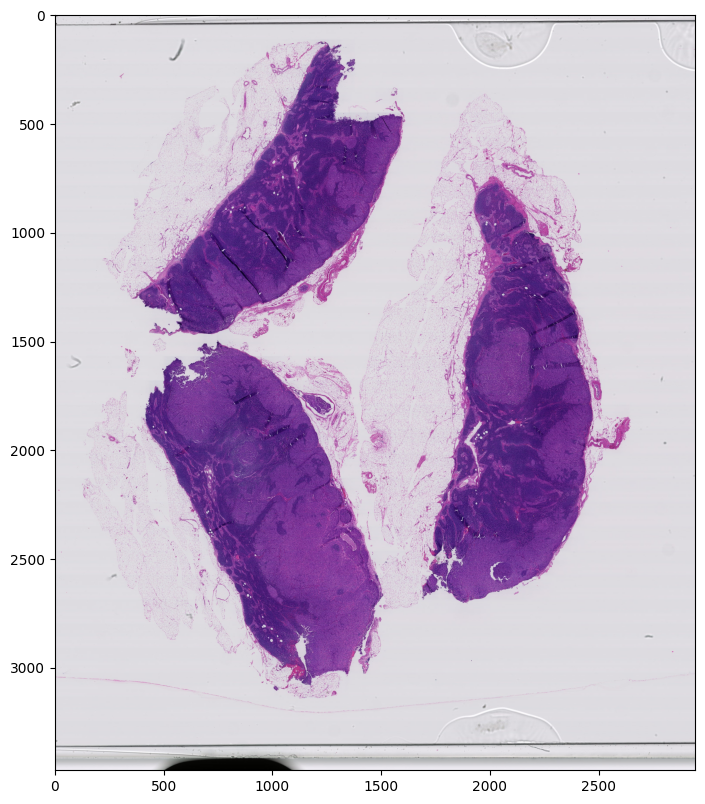

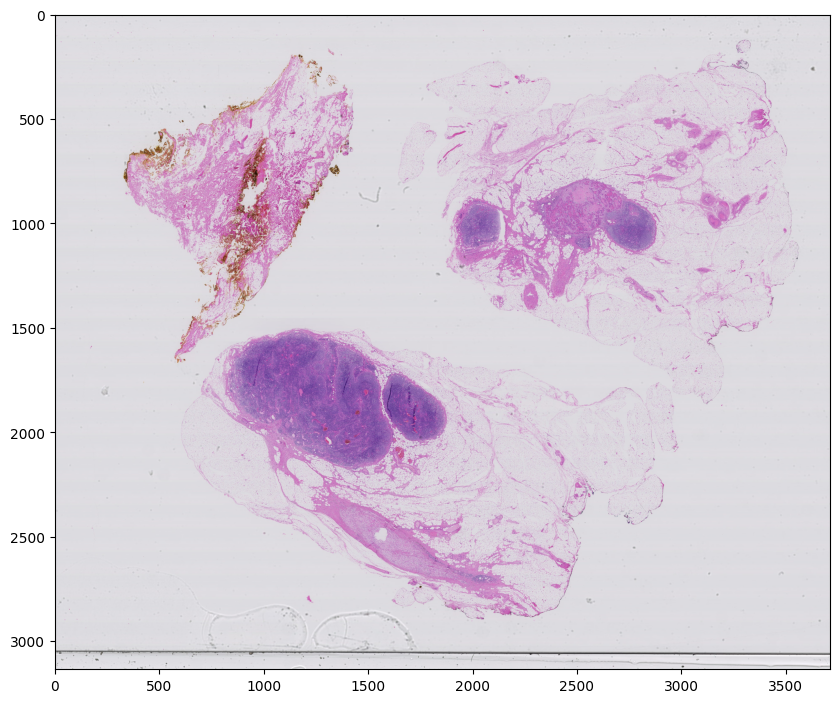

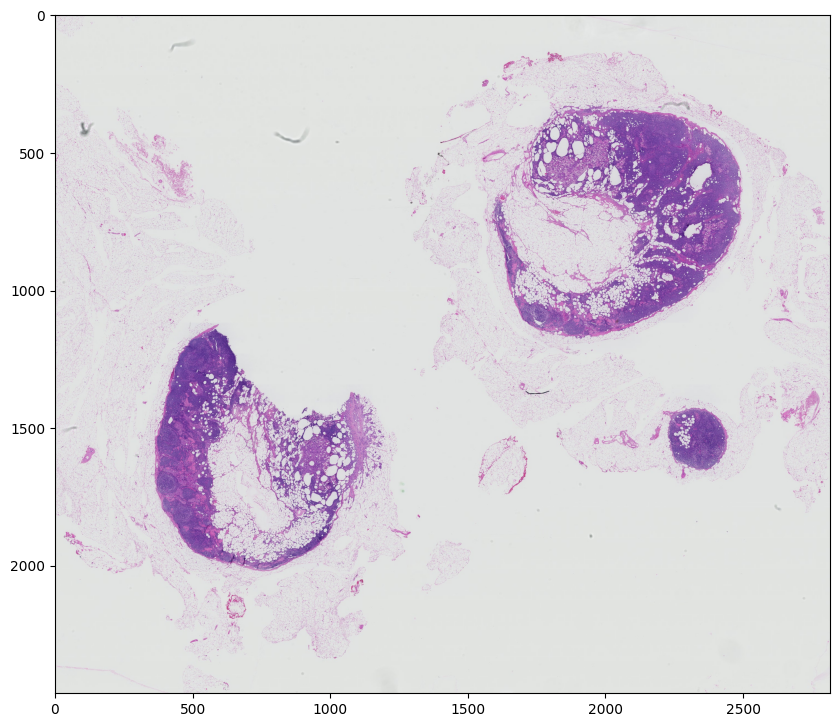

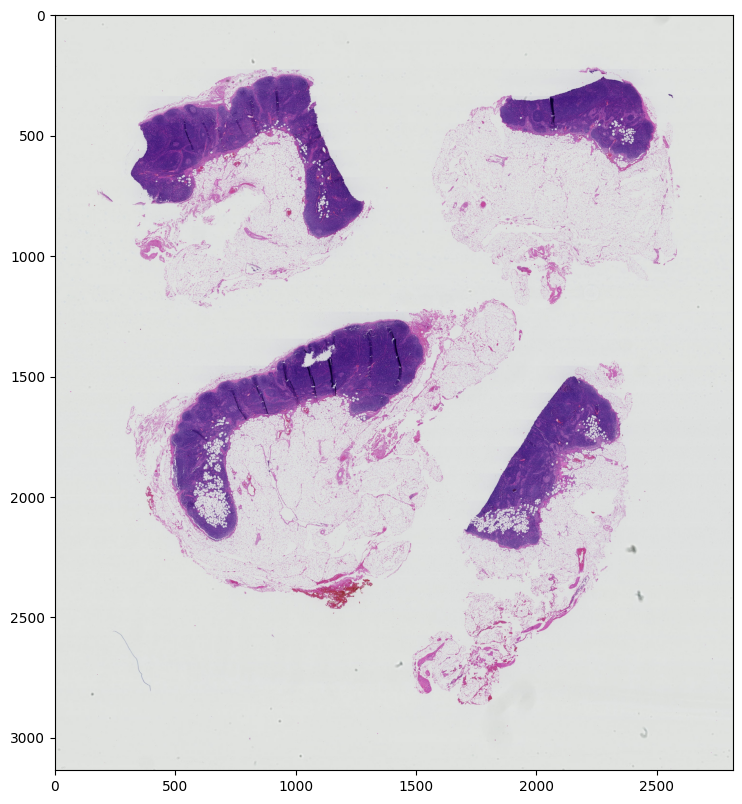

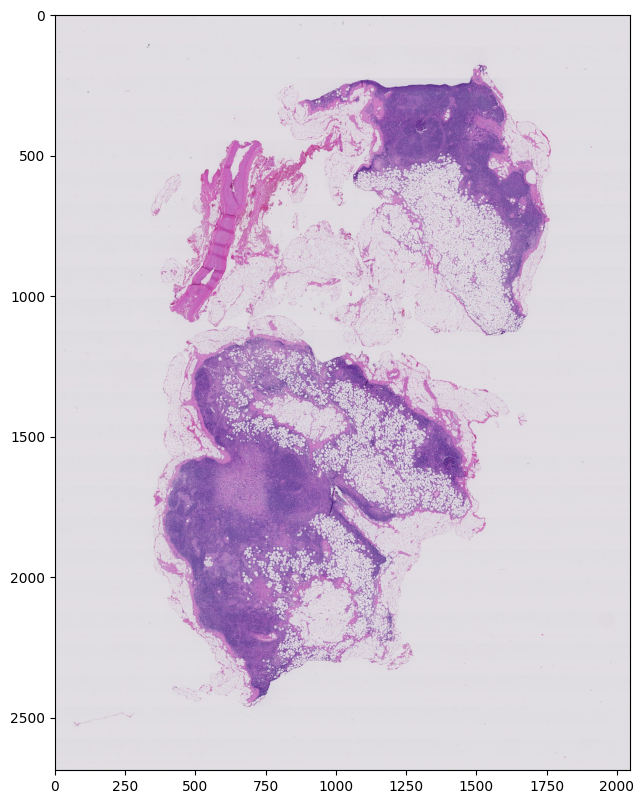

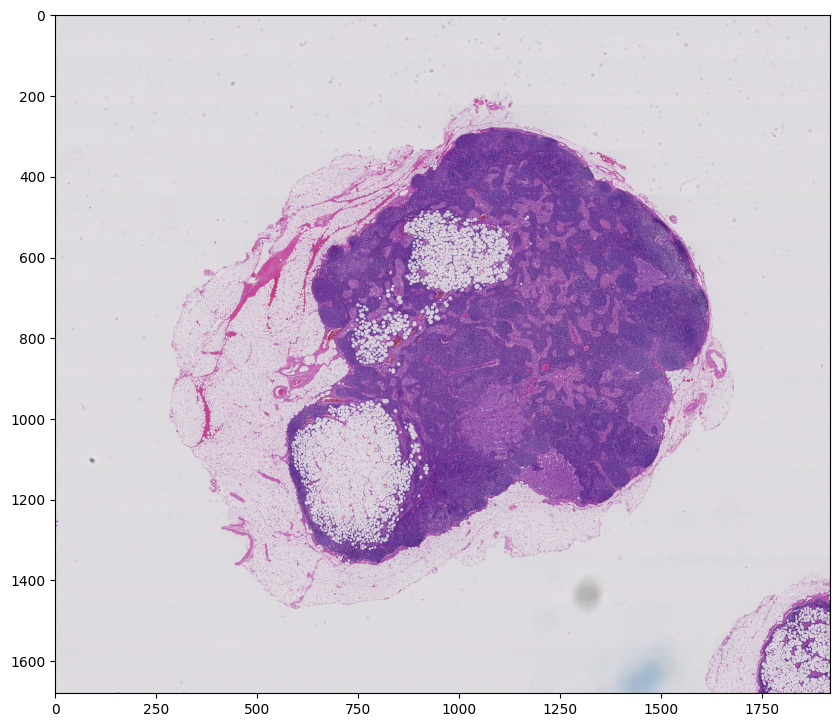

In [9]:
# Example: read the entire slide at level 5

# Higher zoom levels may not fit into memory.
# You can use the below function to extract regions from higher zoom levels 
# without having to read the entire image into ram.

# Use the sliding window approach discussed in class to collect training
# data for your classifier. E.g., slide a window across the slide (for
# starters, use a zoomed out view, so you're not working with giant images).
# Save each window to disk as an image. To find the label for that image, 
# check to the tissue mask to see if the same region contains cancerous cells.

# Important: this is tricky to get right. Carefully debug your pipeline before
# training your model. Start with just a single image, and a relatively 
# low zoom level.
slide_images = []
# UPDATED TO CHECK SEVERAL SLIDES
for slide, slide_path in zip(slides, slide_paths):
  print(slide_path)
  slide_image = read_slide(slide, 
                          x=0, 
                          y=0, 
                          level=5, 
                          width=slide.level_dimensions[5][0], 
                          height=slide.level_dimensions[5][1])
  
  slide_images.append(slide_image)
  
  plt.figure(figsize=(10,10), dpi=100)
  plt.imshow(slide_image)

In [10]:
mask_images = []
map_masks = []
map_lists = []


for mask, tumor_mask in zip(tumor_mask_paths, tumor_masks):
  mask_image = read_slide(tumor_mask, 
                          x=0, 
                          y=0, 
                          level=5, 
                          width=slide.level_dimensions[5][0], 
                          height=slide.level_dimensions[5][1])
  
  mask_image = mask_image[:,:,0]
  mask_images.append(mask_image)

  map_mask = mask_image.copy()
  map_masks.append(map_mask)


  # CREATE BLANK 'MASK' - USED LATER ON
for map_mask in map_masks:

  for i in range(map_mask.shape[0]):
    for j in range(map_mask.shape[1]):
      map_mask[i][j] = 0

  # AND DICT OF DICTS FOR FUTURE MASK PIXEL VALS (GOING TO AVERAGE LISTS)
  map_list = {}

  for i in range(map_mask.shape[0]):
    map_list[i] = {}
    for j in range(map_mask.shape[1]):
      map_list[i][j] = []
  map_lists.append(map_list)

gc.collect()

0

In [11]:
# USED TO DROP "BLANK SPACE"
def find_tissue_pixels(image, intensity=0.8):
    im_gray = rgb2gray(image)
    assert im_gray.shape == (image.shape[0], image.shape[1])
    indices = np.where(im_gray <= intensity)
    return list(zip(indices[0], indices[1]))


gc.collect()

0

In [12]:
#@title DEFINING DATA FRAMES


In [13]:
# EXTRACTING PATCHES (PART OF METHODOLOGY IS TRAINING ON SUBSECTIONS OF THE IMAGE - HELPS INCREASE TRAINING SIZE)

counter = 0 #FOR DF INDEX
df = pd.DataFrame(columns = ['patch_name', 'slide_name', 'image_center', 'image', 'outcome'])

# GROUP THE FOUR INPUTS NEEDED
for slide, slide_path, mask_image, slide_image in zip(slides[:4], slide_paths[:4], mask_images[:4], slide_images[:4]):

  print(slide_path)

  tissue_pixels = find_tissue_pixels(slide_image)

  prefix = slide_path[:-4]

  
  for i in range(slide.level_dimensions[5][0] // 96): 
    
    i *= 96 #WANT TO GO EVERY 96 PIXELS (so all pixels are captured in an inner patch)
    # DEFINE PATCH HORIZONTAL BOUNDARIES
    left_edge = i
    right_edge = i + 299
    hz_center = int(round((left_edge + right_edge)/2))

    #GET CENTER 128 HZ BOUNDARIES
    inner_left_edge = hz_center - 63
    inner_right_edge = hz_center + 64

    if right_edge < mask_image.shape[0]: #EXPERIMENTATION SHOWED EXAMPLES OF GOING OFF OF EDGE OF MASK; JUST BE SUPER SURE
      for j in range(slide.level_dimensions[5][1] // 96):
        j *= 96
        
#         ONLY CONSIDER TISSUE PIXELS, NOT BLANK SPACE; USING CENTER AND CORNERS TO CHECK
        if ((i, j) in tissue_pixels) or ((inner_left_edge, j - 63) in tissue_pixels) or ((inner_left_edge, j + 64) in tissue_pixels) or\
        ((inner_right_edge, j - 63) in tissue_pixels) or ((inner_right_edge, j + 64) in tissue_pixels):

          center_cancer = 0

          # DEFINE PATCH VERTICAL BOUNDARIES
          bottom_edge = j #* 299 
          top_edge = j + 299#(j + 1) * 299 
          vt_center = int(round((bottom_edge + top_edge)/2))

          if top_edge < mask_image.shape[1]: #DON'T PUSH ME CUZ I'M CLOSE TO THE EDGE

            #GET CENTER 128 VT BOUNDAIRES
            inner_bottom_edge = vt_center - 63
            inner_top_edge = vt_center + 64 
            ctr = str(hz_center) + '_' + str(vt_center)

            #SUM PIXEL VALUES FOR SAME REGION IN THE MASK FILE - >0 MEANS THERE'S A TUMOR
            for m in np.arange(inner_left_edge, inner_right_edge):
              for n in np.arange(inner_bottom_edge, inner_top_edge): 
                center_cancer += mask_image[m][n]

            patch_name = prefix + '_' + str(hz_center) + '_' + str(vt_center) #WANT UNIQUE NAMES FOR EACH PATCH

            region = read_slide(slide, x=hz_center, y=vt_center, level=5, width=299, height=299) #ALSO NEED IMAGE DATA FOR MODEL LATER; NOTE THAT WE DON'T LIMIT CHANNEL LIKE FOR TUMOR MASK

            #DEFINE IMAGE
            mdl_img = tf.convert_to_tensor(region.copy() / 255, dtype = tf.float32) #NORMALIZE PIXELS; CONVERT TO TENSOR FOR MODEL; order='C'
            # NOTE THAT THERE IS NO * 128 OR ANYTHING HERE - CENTERS ALREADY DEFINED ACCURATELY

            df.loc[counter, 'slide_name'] = prefix
            df.loc[counter, 'image_center'] = ctr
            df.loc[counter, 'image'] =  mdl_img
            df.loc[counter, 'outcome'] = 1 if center_cancer > 0 else 0 #CONVERT OUTCOME TO BINARY - CANCER OR NAH

            counter += 1 #SO WE DON'T OVERWRITE DATAFRAME RECORDS LATER

  del tissue_pixels
  gc.collect()

tumor_078.tif
tumor_094.tif
tumor_075.tif
tumor_081.tif


In [14]:
# SAME PROCESS BUT FOR TEST IMAGES LATER
# EXTRACTING PATCHES
# counter = 0 #FOR DF INDEX
patches_to_pixels_list = []
test_df = pd.DataFrame(columns = ['patch_name', 'slide_name', 'image_center', 'image', 'outcome'])

for slide, slide_path, mask_image, slide_image in zip(slides[4:], slide_paths[4:], mask_images[4:], slide_images[4:]):
  counter = 0
  print(slide_path)

  iter_df = pd.DataFrame(columns = ['patch_name', 'slide_name', 'image_center', 'image', 'outcome'])

  tissue_pixels = find_tissue_pixels(slide_image)

  # DICT TO ASSIGN EACH PIXEL TO EACH PATCH IN WHICH THEY APPEAR
  patch_to_pixels = {}

  prefix = slide_path[:-4]

  
  for i in range(slide.level_dimensions[5][0] // 96): 
    
    i *= 96 #WANT TO GO EVERY 128 PIXELS (so all pixels are captured in an inner patch)
    # DEFINE PATCH HORIZONTAL BOUNDARIES
    left_edge = i
    right_edge = i + 299
    hz_center = int(round((left_edge + right_edge)/2))

    #GET CENTER 128 HZ BOUNDARIES
    inner_left_edge = hz_center - 63
    inner_right_edge = hz_center + 64

    if right_edge < mask_image.shape[0]: #EXPERIMENTATION SHOWED EXAMPLES OF GOING OFF OF EDGE OF MASK; JUST BE SUPER SURE
      for j in range(slide.level_dimensions[5][1] // 96):
        j *= 96

        if ((i, j) in tissue_pixels) or ((inner_left_edge, j - 63) in tissue_pixels) or ((inner_left_edge, j + 64) in tissue_pixels) or\
        ((inner_right_edge, j - 63) in tissue_pixels) or ((inner_right_edge, j + 64) in tissue_pixels):

          center_cancer = 0

          # DEFINE PATCH VERTICAL BOUNDARIES
          bottom_edge = j #* 299 
          top_edge = j + 299#(j + 1) * 299 
          vt_center = int(round((bottom_edge + top_edge)/2))

          if top_edge < mask_image.shape[1]: #DON'T PUSH ME CUZ I'M CLOSE TO THE EDGE

            #GET CENTER 128 VT BOUNDAIRES
            inner_bottom_edge = vt_center - 63
            inner_top_edge = vt_center + 64 
            ctr = str(hz_center) + '_' + str(vt_center)
            patch_to_pixels[ctr] = [] #CREATE EMPTY LIST ASSOCIATED WITH IMAGE CENTER

            #SUM PIXEL VALUES FOR SAME REGION IN THE MASK FILE - >0 MEANS THERE'S A TUMOR
            for m in np.arange(inner_left_edge, inner_right_edge):
              for n in np.arange(inner_bottom_edge, inner_top_edge): 
                center_cancer += mask_image[m][n]
                patch_to_pixels[ctr].append([m, n]) #ADD EACH PIXEL COORD TO LIST OF PIXELS ASSOC W/CTR

            patch_name = prefix + '_' + str(hz_center) + '_' + str(vt_center) #WANT UNIQUE NAMES FOR EACH PATCH

            region = read_slide(slide, x=hz_center, y=vt_center, level=5, width=299, height=299) #ALSO NEED IMAGE DATA FOR MODEL LATER; NOTE THAT WE DON'T LIMIT CHANNEL LIKE FOR TUMOR MASK

            #DEFINE IMAGE
            mdl_img = tf.convert_to_tensor(region.copy() / 255, dtype = tf.float32) #NORMALIZE PIXELS; CONVERT TO TENSOR FOR MODEL; order='C'
            # NOTE THAT THERE IS NO * 128 OR ANYTHING HERE - CENTERS ALREADY DEFINED ACCURATELY

            iter_df.loc[counter, 'slide_name'] = prefix
            iter_df.loc[counter, 'image_center'] = ctr
            iter_df.loc[counter, 'image'] =  mdl_img
            iter_df.loc[counter, 'outcome'] = 1 if center_cancer > 0 else 0 #CONVERT OUTCOME TO BINARY - CANCER OR NAH

            counter += 1 #SO WE DON'T OVERWRITE DATAFRAME RECORDS LATER
  if slide_path == 'tumor_084.tif':
    hm_df = iter_df.copy()
  else:
    hm_df_2 = iter_df.copy()

  test_df = pd.concat([test_df, iter_df])
  patches_to_pixels_list.append(patch_to_pixels)
  del tissue_pixels
  gc.collect()

tumor_084.tif
tumor_091.tif


10
( 342 , 1398 )
(299, 299, 3)
0.26666668
0.94509804


4

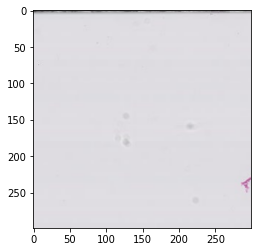

In [15]:
# VISUALLY CHECKING ONE RANDOM PATCH WITH TUMOR TISSUE
idx = rand.sample(df[df['outcome'] == 1].index.values.tolist(), 1)[0]
print(idx)

sample_img = df.loc[idx, 'image']
sample_outcome = df.loc[idx, 'outcome']
center = df.loc[idx, 'image_center']
hz_coord = center.split('_')[0]
vt_coord = center.split('_')[1]
print('(', hz_coord, ',', vt_coord, ')')

# CHECK THAT EVERYTHING IS SCALED/SIZED CORRECTLY

print(sample_img.shape)
print(sample_img.numpy().min())
print(sample_img.numpy().max())
plt.imshow(sample_img)

# AND THAT SAMPLE PATCH DISPLAYS CORRECTLY

gc.collect()

In [16]:
IMG_SIZE = (299, 299)
IMG_SHAPE = IMG_SIZE + (3,)
# USING TRANSFER LEARNING FOR FIRST PASS AT MODELING
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')
gc.collect()

9406464/9406464 [==============================] - 0s 0us/step


0

In [17]:
train_images, val_images, train_outcomes, val_outcomes = train_test_split(df['image'].to_list(), df['outcome'].to_list(), test_size=0.33, random_state=42)

# NEED FULL LARRY FOR HEATMAP LARRY
test_images, test_outcomes = test_df['image'].to_list(), test_df['outcome'].to_list()
hm_images, hm_outcomes = hm_df['image'].to_list(), hm_df['outcome'].to_list()
hm_images_2, hm_outcomes_2 = hm_df_2['image'].to_list(), hm_df_2['outcome'].to_list()

train_label_ds = tf.data.Dataset.from_tensor_slices(tf.cast(tf.convert_to_tensor(train_outcomes), tf.int64))
train_image_ds = tf.data.Dataset.from_tensor_slices(tf.convert_to_tensor(train_images))
val_label_ds = tf.data.Dataset.from_tensor_slices(tf.cast(tf.convert_to_tensor(val_outcomes), tf.int64))
val_image_ds = tf.data.Dataset.from_tensor_slices(tf.convert_to_tensor(val_images))

test_label_ds = tf.data.Dataset.from_tensor_slices(tf.cast(tf.convert_to_tensor(test_outcomes), tf.int64))
test_image_ds = tf.data.Dataset.from_tensor_slices(tf.convert_to_tensor(test_images))

hm_label_ds = tf.data.Dataset.from_tensor_slices(tf.cast(tf.convert_to_tensor(hm_outcomes), tf.int64))
hm_image_ds = tf.data.Dataset.from_tensor_slices(tf.convert_to_tensor(hm_images))
hm_label_ds_2 = tf.data.Dataset.from_tensor_slices(tf.cast(tf.convert_to_tensor(hm_outcomes_2), tf.int64))
hm_image_ds_2 = tf.data.Dataset.from_tensor_slices(tf.convert_to_tensor(hm_images_2))


del train_images, val_images, train_outcomes, val_outcomes

train_image_label_ds = tf.data.Dataset.zip((train_image_ds, train_label_ds))
del train_image_ds, train_label_ds

val_image_label_ds = tf.data.Dataset.zip((val_image_ds, val_label_ds))
del val_image_ds, val_label_ds

# FOR HEATMAP AT END
test_image_label_ds = tf.data.Dataset.zip((test_image_ds, test_label_ds))
del test_image_ds, test_label_ds
hm_image_label_ds = tf.data.Dataset.zip((hm_image_ds, hm_label_ds))
del hm_image_ds, hm_label_ds
hm_image_label_ds_2 = tf.data.Dataset.zip((hm_image_ds_2, hm_label_ds_2))
del hm_image_ds_2, hm_label_ds_2

print(train_image_label_ds)
print(val_image_label_ds)
print(test_image_label_ds)
gc.collect()

<ZipDataset element_spec=(TensorSpec(shape=(299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<ZipDataset element_spec=(TensorSpec(shape=(299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<ZipDataset element_spec=(TensorSpec(shape=(299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


2785

In [18]:
# DOUBLE CHECK SIZING
for img, label in train_image_label_ds.take(2):
  print(img.shape, label.numpy().sum())
gc.collect()

(299, 299, 3) 1
(299, 299, 3) 0


0

In [19]:
# A benchmark utility to time how long it takes
# to iterate once over the entire dataset
def time_one_epoch(ds):
  start = time.time()
  batches = 0
  for i,(images,labels) in enumerate(ds):
    batches += 1
    if i % 10 == 0:
      print('.', end='')
  print()
  end = time.time()
  duration = end-start
  print("Read {} batches".format(batches))
  print("{:0.2f} Batches/s".format(batches/duration))
  print("{:0.2f} Images/s".format(BATCH_SIZE*batches/duration))
  print("Total time: {}s".format(duration))

In [20]:
# CREATE TRAINING DATASET FOR MODEL
train_ds = train_image_label_ds.cache() # cache data in memory
train_ds = train_ds.shuffle(SHUFFLE_SIZE)
train_ds = train_ds.batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)
del train_image_label_ds
gc.collect()

0

In [21]:
# AND VALIDATION
val_ds = val_image_label_ds.cache() # cache data in memory
val_ds = val_ds.shuffle(SHUFFLE_SIZE)
val_ds = val_ds.batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)
del val_image_label_ds

# AND TEST
test_ds = test_image_label_ds.cache()
test_ds = test_ds.shuffle(SHUFFLE_SIZE)
test_ds = test_ds.batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)
del test_image_label_ds

# AND TWO HEATMAP SETS FOR LATER
hm_ds = hm_image_label_ds.cache()
hm_ds = hm_ds.shuffle(SHUFFLE_SIZE)
hm_ds = hm_ds.batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)
del hm_image_label_ds

hm_ds_2 = hm_image_label_ds_2.cache()
hm_ds_2 = hm_ds_2.shuffle(SHUFFLE_SIZE)
hm_ds_2 = hm_ds_2.batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)
del hm_image_label_ds_2
gc.collect()

0

In [22]:
# CHECK THAT EVERYTHING LOOKS IN ORDER
print(train_ds)
print(val_ds)
print(test_ds)
print(hm_ds)

<PrefetchDataset element_spec=(TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>
<PrefetchDataset element_spec=(TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>
<PrefetchDataset element_spec=(TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>
<PrefetchDataset element_spec=(TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>


In [23]:
time_one_epoch(train_ds) # this will be slow

.
Read 9 batches
18.16 Batches/s
581.13 Images/s
Total time: 0.49558496475219727s


In [24]:
time_one_epoch(train_ds) # this will be fast

.
Read 9 batches
88.06 Batches/s
2817.92 Images/s
Total time: 0.1022031307220459s


In [25]:
# A hack to show you the output shape of the model
for image_batch, label_batch in train_ds.take(1):
   pass
  
feature_batch = base_model(image_batch)
print(feature_batch.shape)

(32, 10, 10, 1280)


In [26]:
# do not update the pretrained weights during training
# (we won't use finetuning here)
base_model.trainable = False 

In [27]:
base_model.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 150, 150, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 150, 150, 32  128         ['Conv1[0][0]']                  
                                )                                              

In [28]:
# WANT TO POOL BEFORE PREDICTIONS BECAUSE IT IS IMAGE DATA
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
# 2 HIDDEN UNITS BECAUSE BINARY CLASSIFICAITON; SOFTMAX FOR PROBABILITIES
prediction_layer = tf.keras.layers.Dense(2, activation='softmax')
gc.collect()

21

In [29]:
# build a new model reusing the pretrained base
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  prediction_layer
])
gc.collect()

117

In [30]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [31]:
model.fit(train_ds, validation_data=val_ds, epochs=5)
gc.collect()

Epoch 1/5


/usr/local/lib/python3.8/dist-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


9/9 [==============================] - 31s 3s/step - loss: 0.5035 - accuracy: 0.7923 - val_loss: 0.4986 - val_accuracy: 0.8014
Epoch 2/5
9/9 [==============================] - 22s 3s/step - loss: 0.3333 - accuracy: 0.8521 - val_loss: 0.3728 - val_accuracy: 0.7730
Epoch 3/5
9/9 [==============================] - 22s 2s/step - loss: 0.3387 - accuracy: 0.8486 - val_loss: 0.3558 - val_accuracy: 0.7801
Epoch 4/5
9/9 [==============================] - 24s 3s/step - loss: 0.3188 - accuracy: 0.8345 - val_loss: 0.3451 - val_accuracy: 0.7801
Epoch 5/5
9/9 [==============================] - 22s 3s/step - loss: 0.3048 - accuracy: 0.8486 - val_loss: 0.3366 - val_accuracy: 0.7943


6500

In [32]:
#@title How are we doing vs. simple baseline (rate of occurence for more frequent class)?

In [33]:
tumors = 0
records = 0
for image, answer in train_ds.take(len(train_ds)):
  tumors += answer.numpy().sum()
  records += image.shape[0]
if tumors/records < .5:
  print('baseline for training is: ', 1 - tumors/records)
else:
  print('baseline for training is: ', tumors/records)

val_tumors = 0
val_records = 0
for image, answer in val_ds.take(len(val_ds)):
  val_tumors += answer.numpy().sum()
  val_records += image.shape[0]
if val_tumors/val_records < .5:
  print('baseline for validation is: ', 1 - val_tumors/val_records)
else:
  print('baseline for validation is: ', val_tumors/val_records)

gc.collect()

baseline for training is:  0.8485915492957746
baseline for validation is:  0.801418439716312


0

In [34]:
#@title So we are just hitting our "dumb" baseline - likely the model simply predicts 0 for everything; confirming below

In [35]:
for image, answer in train_ds:
  for prediction in model.predict(x = image):
    print(prediction)
gc.collect()

1/1 [==============================] - 3s 3s/step
[0.97094905 0.02905097]
[0.9627808  0.03721933]
[0.96268296 0.03731707]
[0.97075516 0.02924485]
[0.9357402 0.0642599]
[0.9668556  0.03314436]
[0.9705251  0.02947486]
[0.96282434 0.0371755 ]
[0.95802516 0.04197481]
[0.97267944 0.02732045]
[0.9694176 0.0305824]
[0.9545315  0.04546851]
[0.95224905 0.04775089]
[0.43345448 0.5665455 ]
[0.81131554 0.1886844 ]
[0.9672265  0.03277341]
[0.96002525 0.03997466]
[0.9033817  0.09661818]
[0.9687215  0.03127853]
[0.9658772  0.03412281]
[0.9725397  0.02746036]
[0.9513959  0.04860404]
[0.44755378 0.55244625]
[0.97024924 0.02975075]
[0.9601356  0.03986447]
[0.4467684  0.55323154]
[0.9444204  0.05557961]
[0.7036743  0.29632556]
[0.9556604  0.04433956]
[0.93599015 0.06400983]
[0.6490561  0.35094398]
[0.63881373 0.36118627]
1/1 [==============================] - 2s 2s/step
[0.9685624 0.0314376]
[0.9698163  0.03018367]
[0.96513    0.03486997]
[0.93177396 0.06822594]
[0.9602603  0.03973971]
[0.97411156 0.0258

1870

In [36]:
#@title That's pretty close to what is happening. Given that the model fails even on train data, my next goal is to get this accuracy up I'll start by using augmentation to increase sample size; if this doesn't work either I will try defining a new model


In [37]:
# DEFINE AUGMENTATION FUNCTION
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip("horizontal_and_vertical"),
  tf.keras.layers.RandomRotation(0.2),
  tf.keras.layers.RandomContrast((1,0)),
])

gc.collect()

0

0

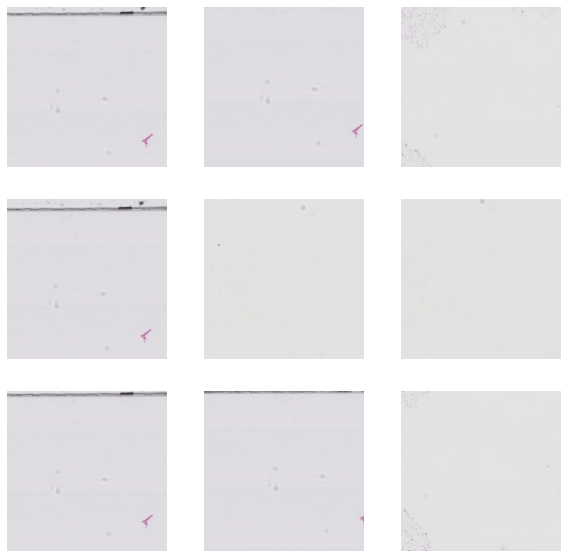

In [38]:
# SHOW SOME AUGMENTED IMAGES
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[i])
    plt.axis("off")
gc.collect()

In [39]:
# CREATE AUGMENTED DS, NORMALIZE IT
aug_ds = train_ds.map(
  lambda x, y: (data_augmentation(x, training=True), y))
print(aug_ds)
print(train_ds)
gc.collect()

<MapDataset element_spec=(TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>
<PrefetchDataset element_spec=(TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>


5620

In [40]:
# PUT ORIGINAL AND AUGMENTED DATA TOGETHER
total_ds = train_ds.concatenate(aug_ds)
print(total_ds)
gc.collect()

<ConcatenateDataset element_spec=(TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>


0

In [41]:
aug_image, aug_outcome = next(iter(aug_ds))
print(aug_image.shape, aug_outcome)
gc.collect()

(32, 299, 299, 3) tf.Tensor([0 1 0 1 1 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0], shape=(32,), dtype=int64)


0

In [42]:
aug_image, aug_outcome = next(iter(train_ds))
print(aug_image.shape, aug_outcome)
gc.collect()

(32, 299, 299, 3) tf.Tensor([0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0], shape=(32,), dtype=int64)


0

In [43]:
epochs=10
history = model.fit(
  total_ds, 
  validation_data=val_ds,
  epochs=epochs
)
gc.collect()

Epoch 1/10
18/18 [==============================] - 45s 3s/step - loss: 0.3268 - accuracy: 0.8486 - val_loss: 0.4008 - val_accuracy: 0.8014
Epoch 2/10
18/18 [==============================] - 42s 2s/step - loss: 0.3522 - accuracy: 0.8415 - val_loss: 0.3550 - val_accuracy: 0.8298
Epoch 3/10
18/18 [==============================] - 43s 2s/step - loss: 0.3471 - accuracy: 0.8592 - val_loss: 0.3339 - val_accuracy: 0.8511
Epoch 4/10
18/18 [==============================] - 43s 2s/step - loss: 0.3331 - accuracy: 0.8574 - val_loss: 0.3461 - val_accuracy: 0.8014
Epoch 5/10
18/18 [==============================] - 42s 2s/step - loss: 0.3144 - accuracy: 0.8415 - val_loss: 0.3264 - val_accuracy: 0.8014
Epoch 6/10
18/18 [==============================] - 42s 2s/step - loss: 0.3213 - accuracy: 0.8468 - val_loss: 0.3492 - val_accuracy: 0.8085
Epoch 7/10
18/18 [==============================] - 42s 2s/step - loss: 0.3217 - accuracy: 0.8504 - val_loss: 0.3298 - val_accuracy: 0.8369
Epoch 8/10
18/18 [==

0

In [44]:
#@title We now beat our baseline, albeit very slightly. As a next step, we incorporate different magnification levels

In [45]:
gc.collect()

0

4

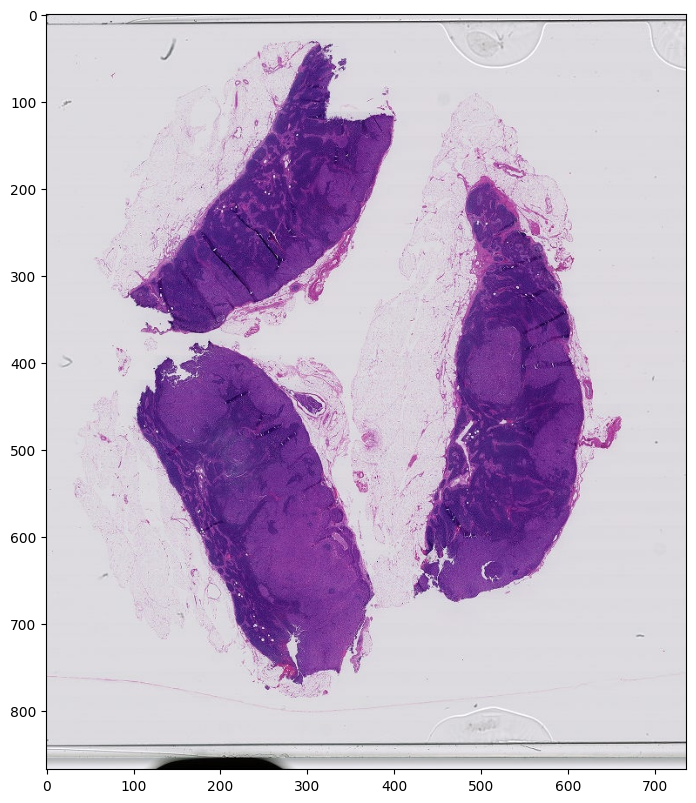

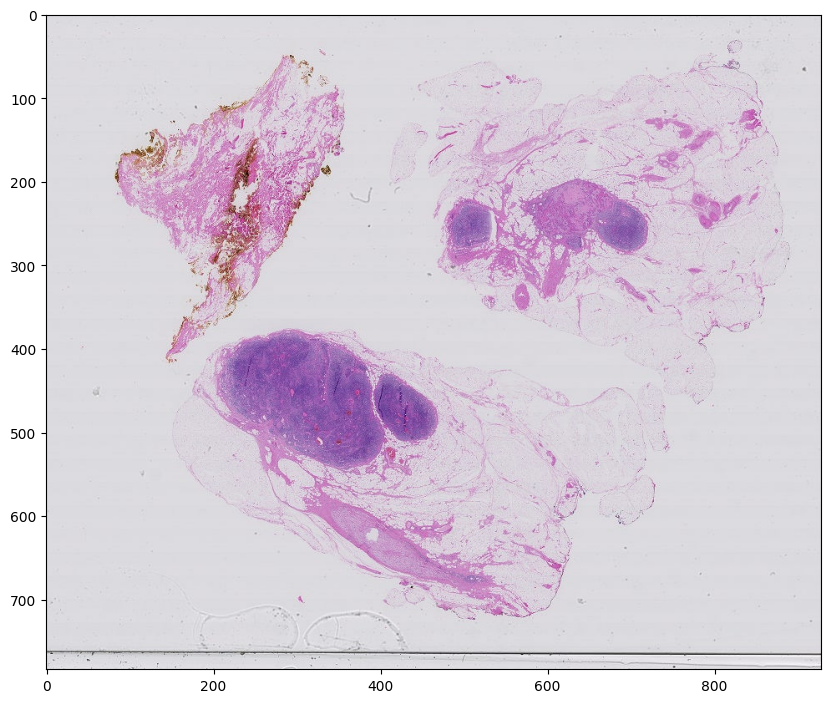

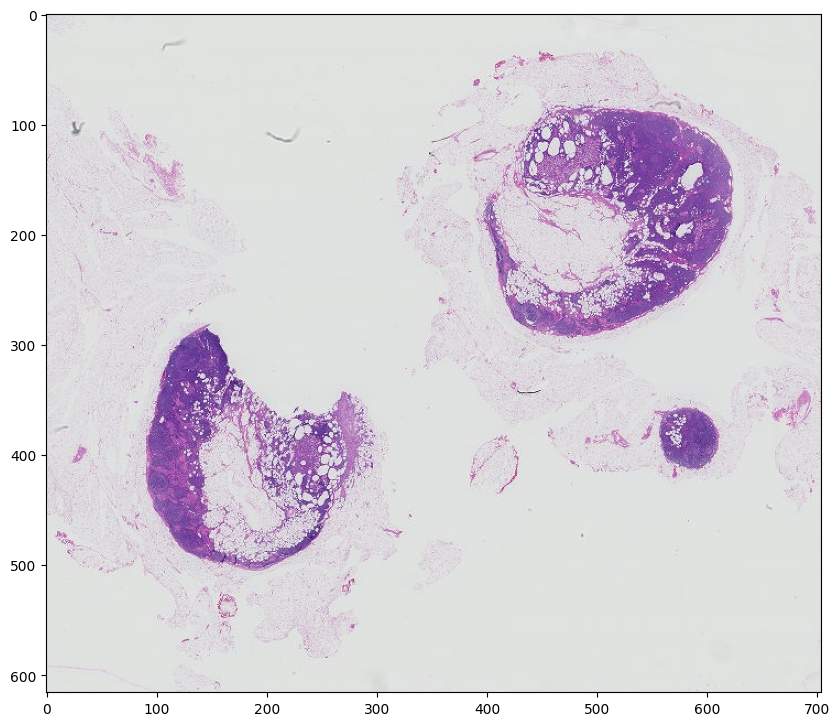

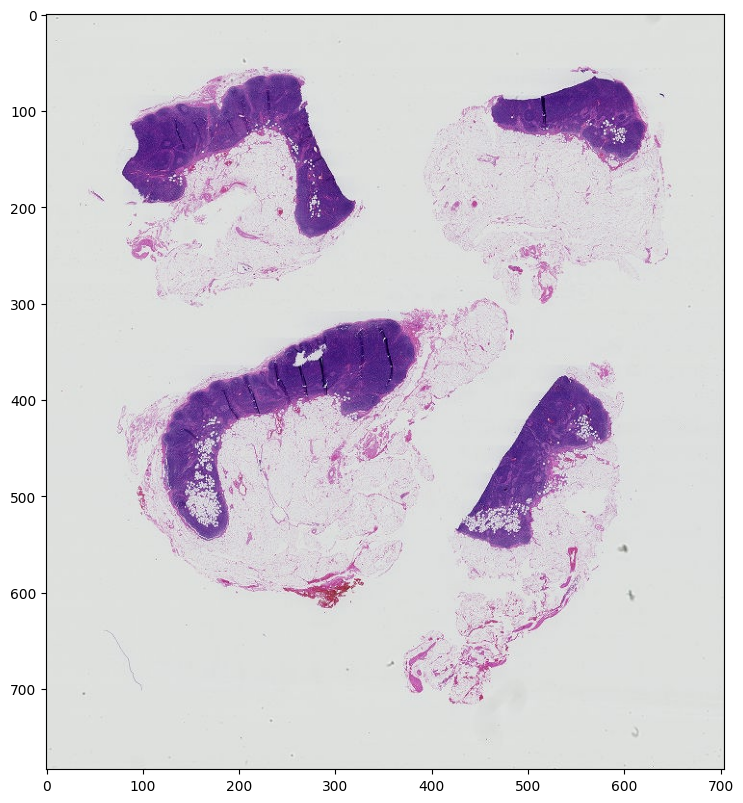

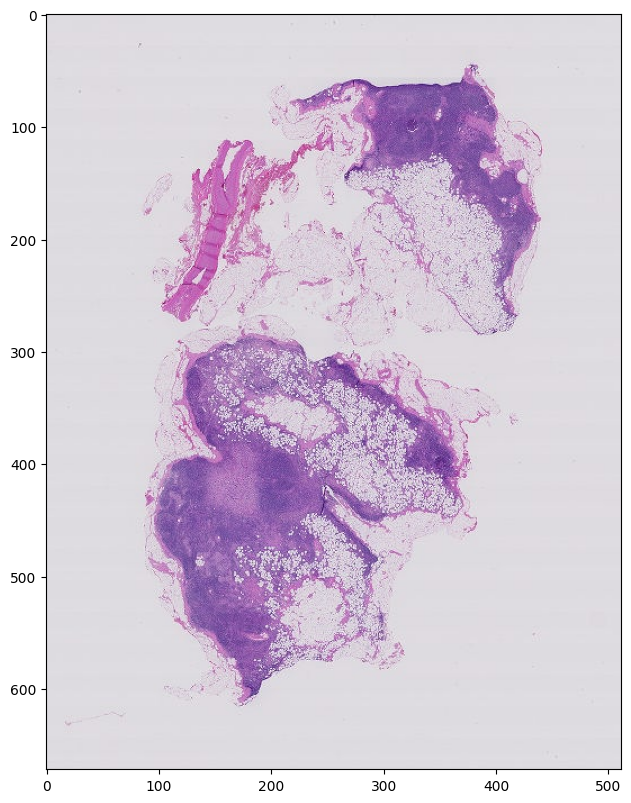

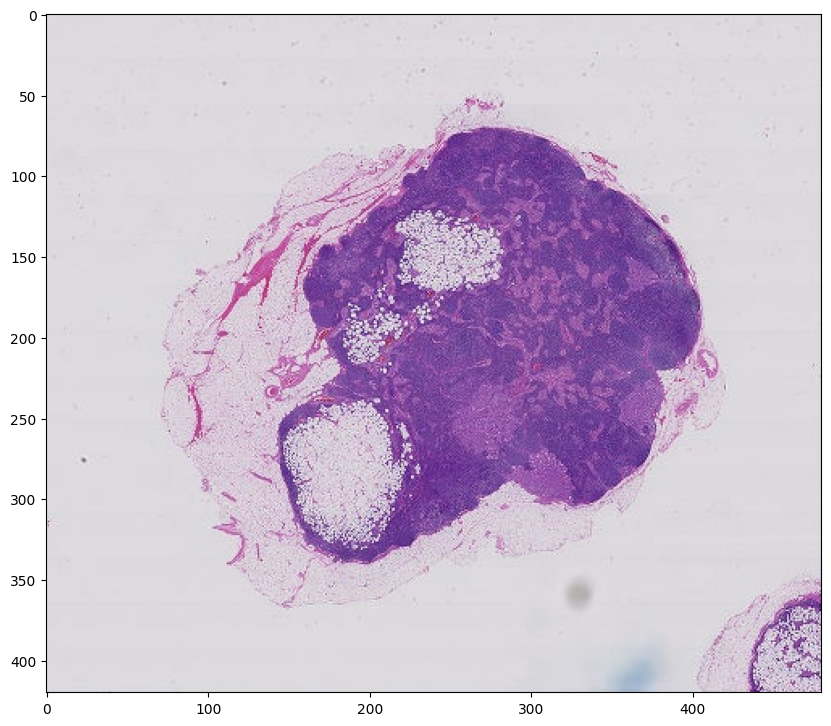

In [46]:
zoom_in_images = []
for slide in slides:
  zoom_in_image = read_slide(slide, 
                          x=0, 
                          y=0, 
                          level=7, 
                          width=slide.level_dimensions[7][0], 
                          height=slide.level_dimensions[7][1])

  zoom_in_images.append(zoom_in_image)

  plt.figure(figsize=(10,10), dpi=100)
  plt.imshow(zoom_in_image)
gc.collect()

In [47]:
# SAME PROCESS AS ABOVE BUT NOW AT A DIFFERENT MAGNIFICATION LEVEL
zoom_in_mask_images = []
zoom_in_map_masks = []
zoom_in_map_lists = []

for mask, tumor_mask in zip(tumor_mask_paths, tumor_masks):
  zoom_in_mask_image = read_slide(tumor_mask, 
                          x=0, 
                          y=0, 
                          level=7, 
                          width=slide.level_dimensions[7][0], 
                          height=slide.level_dimensions[7][1])
  
  zoom_in_mask_image = zoom_in_mask_image[:,:,0]
  zoom_in_mask_images.append(zoom_in_mask_image)

  zoom_in_map_mask = zoom_in_mask_image.copy()
  zoom_in_map_masks.append(zoom_in_map_mask)


  # # CREATE BLANK 'MASK'
for zoom_in_map_mask in zoom_in_map_masks:

  for i in range(zoom_in_map_mask.shape[0]):
    for j in range(zoom_in_map_mask.shape[1]):
      zoom_in_map_mask[i][j] = 0

  # AND DICT OF DICTS FOR FUTURE MASK PIXEL VALS (GOING TO AVERAGE LISTS)
  zoom_in_map_list = {}

  for i in range(zoom_in_map_mask.shape[0]):
    zoom_in_map_list[i] = {}
    for j in range(zoom_in_map_mask.shape[1]):
      zoom_in_map_list[i][j] = []
  zoom_in_map_lists.append(zoom_in_map_list)

gc.collect()

15037

In [48]:
# SAME PROCESS AS ABOVE BUT AT DIFFERENT MAGNIFICATION LEVEL
# EXTRACTING PATCHES
additional_df = pd.DataFrame(columns = ['patch_name', 'slide_name', 'image_center', 'image', 'outcome'])
# patches_to_pixels_list = []
counter = 0 #FOR DF INDEX

for slide, slide_path, zoom_in_mask_image, zoom_in_image in zip(slides[:4], slide_paths[:4], zoom_in_mask_images[:4], zoom_in_images[:4]):



  zoom_in_tissue_pixels = find_tissue_pixels(zoom_in_image)

  # GET 299x299 PATCHES - NEED TO KNOW HOW MANY THIS PROVIDES
  prefix = slide_path[:-4]

  for i in range(slide.level_dimensions[7][0] // (24)): #DIVIDE BY 96 / 4 NOW BECAUSE DOWNSAMPLED BY 4 COMPARED TO ORIG
    
    i *= (24) #WANT TO GO EVERY 30 PIXELS FOR MORE ZOOMED IN
    # DEFINE PATCH HORIZONTAL BOUNDARIES
    left_edge = i 
    right_edge = i + (299//4)
    hz_center = int(round((left_edge + right_edge)/2))

    #GET CENTER 128 HZ BOUNDARIES
    inner_left_edge = hz_center - (63//4)
    inner_right_edge = hz_center + (64//4)

    if right_edge < zoom_in_mask_image.shape[0]: #EXPERIMENTATION SHOWED EXAMPLES OF GOING OFF OF EDGE OF MASK; JUST BE SUPER SURE
      for j in range(slide.level_dimensions[7][1] // (24)):
        j *= (24)

        if ((i, j) in zoom_in_tissue_pixels) or ((inner_left_edge, j - (63//4)) in zoom_in_tissue_pixels) or ((inner_left_edge, j + (64//4)) in zoom_in_tissue_pixels) or\
        ((inner_right_edge, j - (63//4)) in zoom_in_tissue_pixels) or ((inner_right_edge, j + (64//4)) in zoom_in_tissue_pixels):

          center_cancer = 0

          # DEFINE PATCH VERTICAL BOUNDARIES
          bottom_edge = j
          top_edge = j + (299//4)
          vt_center = int(round((bottom_edge + top_edge)/2))

          if top_edge < zoom_in_mask_image.shape[1]: #DON'T PUSH ME CUZ I'M CLOSE TO THE EDGE

            #GET CENTER 128 VT BOUNDAIRES
            inner_bottom_edge = vt_center - (63//4)
            inner_top_edge = vt_center + (64//4)

            #SUM PIXEL VALUES FOR SAME REGION IN THE MASK FILE - >0 MEANS THERE'S A TUMOR
            for m in np.arange(inner_left_edge, inner_right_edge):
              for n in np.arange(inner_bottom_edge, inner_top_edge): 
                center_cancer += zoom_in_mask_image[m][n]

            patch_name = prefix + '_' + str(hz_center) + '_' + str(vt_center) #WANT UNIQUE NAMES FOR EACH PATCH

            region = read_slide(slide, x=hz_center, y=vt_center, level=7, width=299, height=299) #ALSO NEED IMAGE DATA FOR MODEL LATER; NOTE THAT WE DON'T LIMIT CHANNEL LIKE FOR TUMOR MASK

            #DEFINE IMAGE
            mdl_img = tf.convert_to_tensor(region.copy() / 255, dtype = tf.float32) #NORMALIZE PIXELS; CONVERT TO TENSOR FOR MODEL; order='C'
            # NOTE THAT THERE IS NO * 128 OR ANYTHING HERE - CENTERS ALREADY DEFINED ACCURATELY

            additional_df.loc[counter, 'slide_name'] = prefix
            additional_df.loc[counter, 'image_center'] = str(hz_center) + '_' + str(vt_center)
            additional_df.loc[counter, 'image'] =  mdl_img
            additional_df.loc[counter, 'outcome'] = 1 if center_cancer > 0 else 0 #CONVERT OUTCOME TO BINARY - CANCER OR NAH

            counter += 1 #SO WE DON'T OVERWRITE DATAFRAME RECORDS LATER

  # patches_to_pixels_list.append(patch_to_pixels)
  del zoom_in_tissue_pixels

  gc.collect()

In [49]:
# EXTRACTING PATCHES
additional_test_df = pd.DataFrame(columns = ['patch_name', 'slide_name', 'image_center', 'image', 'outcome'])
# patches_to_pixels_list = []
# counter = 0 #FOR DF INDEX

for slide, slide_path, zoom_in_mask_image, zoom_in_image in zip(slides[4:], slide_paths[4:], zoom_in_mask_images[:4], zoom_in_images[4:]):
  counter = 0

  print(slide_path)
  iter_df = pd.DataFrame(columns = ['patch_name', 'slide_name', 'image_center', 'image', 'outcome'])

  zoom_in_tissue_pixels = find_tissue_pixels(zoom_in_image)

  # DICT TO ASSIGN EACH PIXEL TO EACH PATCH IN WHICH TEY APPEAR
  patch_to_pixels = {}

  # GET 299x299 PATCHES - NEED TO KNOW HOW MANY THIS PROVIDES
  prefix = slide_path[:-4]

  for i in range(slide.level_dimensions[7][0] // (24)): #DIVIDE BY 128X4 SINCE THIS MAG LEVEL IS DOWNSAMPLED BY 4 COMPARED TO ORIG
    
    i *= (24) #WANT TO GO EVERY 30 PIXELS FOR MORE ZOOMED IN
    # DEFINE PATCH HORIZONTAL BOUNDARIES
    left_edge = i
    right_edge = i + (299//4)
    hz_center = int(round((left_edge + right_edge)/2))

    #GET CENTER 128 HZ BOUNDARIES
    inner_left_edge = hz_center - (63//4)
    inner_right_edge = hz_center + (64//4)

    if right_edge < zoom_in_mask_image.shape[0]: #EXPERIMENTATION SHOWED EXAMPLES OF GOING OFF OF EDGE OF MASK; JUST BE SUPER SURE
      for j in range(slide.level_dimensions[7][1] // (24)):
        j *= (24)

        if ((i, j) in zoom_in_tissue_pixels) or ((inner_left_edge, j - (63//4)) in zoom_in_tissue_pixels) or ((inner_left_edge, j + (64//4)) in zoom_in_tissue_pixels) or\
        ((inner_right_edge, j - (63//4)) in zoom_in_tissue_pixels) or ((inner_right_edge, j + (64//4)) in zoom_in_tissue_pixels):

          center_cancer = 0

          # DEFINE PATCH VERTICAL BOUNDARIES
          bottom_edge = j
          top_edge = j + (299//4)
          vt_center = int(round((bottom_edge + top_edge)/2))

          if top_edge < zoom_in_mask_image.shape[1]: #DON'T PUSH ME CUZ I'M CLOSE TO THE EDGE

            #GET CENTER 128 VT BOUNDAIRES
            inner_bottom_edge = vt_center - (63//4)
            inner_top_edge = vt_center + (64//4) 
            ctr = str(hz_center) + '_' + str(vt_center)
            patch_to_pixels[ctr] = [] #CREATE EMPTY LIST ASSOCIATED WITH IMAGE CENTER

            #SUM PIXEL VALUES FOR SAME REGION IN THE MASK FILE - >0 MEANS THERE'S A TUMOR
            for m in np.arange(inner_left_edge, inner_right_edge):
              for n in np.arange(inner_bottom_edge, inner_top_edge): 
                center_cancer += zoom_in_mask_image[m][n]
                patch_to_pixels[ctr].append([m, n]) #ADD EACH PIXEL COORD TO LIST OF PIXELS ASSOC W/CTR

            patch_name = 'zoom_' + prefix + '_' + str(hz_center) + '_' + str(vt_center) #WANT UNIQUE NAMES FOR EACH PATCH

            region = read_slide(slide, x=hz_center, y=vt_center, level=7, width=299, height=299) #ALSO NEED IMAGE DATA FOR MODEL LATER; NOTE THAT WE DON'T LIMIT CHANNEL LIKE FOR TUMOR MASK

            #DEFINE IMAGE
            mdl_img = tf.convert_to_tensor(region.copy() / 255, dtype = tf.float32) #NORMALIZE PIXELS; CONVERT TO TENSOR FOR MODEL; order='C'
            # NOTE THAT THERE IS NO * 128 OR ANYTHING HERE - CENTERS ALREADY DEFINED ACCURATELY

            iter_df.loc[counter, 'slide_name'] = prefix
            iter_df.loc[counter, 'image_center'] = str(hz_center) + '_' + str(vt_center)
            iter_df.loc[counter, 'image'] =  mdl_img
            iter_df.loc[counter, 'outcome'] = 1 if center_cancer > 0 else 0 #CONVERT OUTCOME TO BINARY - CANCER OR NAH

            counter += 1 #SO WE DON'T OVERWRITE DATAFRAME RECORDS LATER
  if slide_path == 'tumor_084.tif':
    hm_df_3 = iter_df.copy()
  else:
    hm_df_4 = iter_df.copy()

  additional_test_df = pd.concat([additional_test_df, iter_df])

  patches_to_pixels_list.append(patch_to_pixels)
  del zoom_in_tissue_pixels

  gc.collect()

tumor_084.tif
tumor_091.tif


In [50]:
# SAME PROCESS AS ABOVE
train_images, val_images, train_outcomes, val_outcomes = train_test_split(additional_df['image'].to_list(), additional_df['outcome'].to_list(), test_size=0.33, random_state=42)
test_images_2, test_outcomes_2 = additional_test_df['image'].to_list(), additional_test_df['outcome'].to_list()
hm_images_3, hm_outcomes_3 = hm_df_3['image'].to_list(), hm_df_3['outcome'].to_list()
hm_images_4, hm_outcomes_4 = hm_df_4['image'].to_list(), hm_df_4['outcome'].to_list()


train_label_ds = tf.data.Dataset.from_tensor_slices(tf.cast(tf.convert_to_tensor(train_outcomes), tf.int64))
train_image_ds = tf.data.Dataset.from_tensor_slices(tf.convert_to_tensor(train_images))

val_label_ds = tf.data.Dataset.from_tensor_slices(tf.cast(tf.convert_to_tensor(val_outcomes), tf.int64))
val_image_ds = tf.data.Dataset.from_tensor_slices(tf.convert_to_tensor(val_images))

test_label_ds_2 = tf.data.Dataset.from_tensor_slices(tf.cast(tf.convert_to_tensor(test_outcomes_2), tf.int64))
test_image_ds_2 = tf.data.Dataset.from_tensor_slices(tf.convert_to_tensor(test_images_2))

hm_label_ds_3 = tf.data.Dataset.from_tensor_slices(tf.cast(tf.convert_to_tensor(hm_outcomes_3), tf.int64))
hm_image_ds_3 = tf.data.Dataset.from_tensor_slices(tf.convert_to_tensor(hm_images_3))

hm_label_ds_4 = tf.data.Dataset.from_tensor_slices(tf.cast(tf.convert_to_tensor(hm_outcomes_4), tf.int64))
hm_image_ds_4 = tf.data.Dataset.from_tensor_slices(tf.convert_to_tensor(hm_images_4))


train_image_label_ds = tf.data.Dataset.zip((train_image_ds, train_label_ds))
del train_image_ds, train_label_ds

val_image_label_ds = tf.data.Dataset.zip((val_image_ds, val_label_ds))
del val_image_ds, val_label_ds

test_image_label_ds_2 = tf.data.Dataset.zip((test_image_ds_2, test_label_ds_2))
del test_image_ds_2, test_label_ds_2

hm_image_label_ds_3 = tf.data.Dataset.zip((hm_image_ds_3, hm_label_ds_3))
del hm_image_ds_3, hm_label_ds_3

hm_image_label_ds_4 = tf.data.Dataset.zip((hm_image_ds_4, hm_label_ds_4))
del hm_image_ds_4, hm_label_ds_4

print(train_image_label_ds)
print(val_image_label_ds)
print(test_image_label_ds_2)
gc.collect()

<ZipDataset element_spec=(TensorSpec(shape=(299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<ZipDataset element_spec=(TensorSpec(shape=(299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<ZipDataset element_spec=(TensorSpec(shape=(299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


0

In [51]:
train_ds_2 = train_image_label_ds.cache()
train_ds_2 = train_ds.shuffle(SHUFFLE_SIZE)
del train_image_label_ds
gc.collect()

val_ds_2 = val_image_label_ds.cache() # cache data in memory
val_ds_2 = val_ds.shuffle(SHUFFLE_SIZE)
del val_image_label_ds

test_ds_2 = test_image_label_ds_2.cache()
test_ds_2 = test_ds_2.shuffle(SHUFFLE_SIZE)
test_ds_2 = test_ds_2.batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)
del test_image_label_ds_2

hm_ds_3 = hm_image_label_ds_3.cache()
hm_ds_3 = hm_ds_3.shuffle(SHUFFLE_SIZE)
hm_ds_3 = hm_ds_3.batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)
del hm_image_label_ds_3

hm_ds_4 = hm_image_label_ds_4.cache()
hm_ds_4 = hm_ds_4.shuffle(SHUFFLE_SIZE)
hm_ds_4 = hm_ds_4.batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)
del hm_image_label_ds_4
gc.collect()

0

In [52]:
# CHECK EVERYTHING WENT WELL
print(train_ds_2)
print(val_ds_2)
print(test_ds_2)

<ShuffleDataset element_spec=(TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>
<ShuffleDataset element_spec=(TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>
<PrefetchDataset element_spec=(TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>


In [53]:
# A hack to show you the output shape of the model
for image_batch, label_batch in train_ds_2.take(1):
   pass
  
feature_batch = base_model(image_batch)
print(feature_batch.shape)

(32, 10, 10, 1280)


In [54]:
# CREATE AUGMENTED DS, NORMALIZE IT
aug_ds_2 = train_ds_2.map(
  lambda x, y: (data_augmentation(x, training=True), y))
print(aug_ds_2)
print(train_ds_2)
gc.collect()

<MapDataset element_spec=(TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>
<ShuffleDataset element_spec=(TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>


0

In [55]:
total_ds = total_ds.concatenate(aug_ds_2).concatenate(train_ds_2)
val_ds = val_ds.concatenate(val_ds_2)
test_ds = test_ds.concatenate(test_ds_2)
print(total_ds)
gc.collect()

<ConcatenateDataset element_spec=(TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>


0

In [56]:
# CHECKING MODEL NOW WITH MULTIPLE ZOOM LEVELS, AND EACH LEVEL WITH AUGMENTED DATA
epochs=10
history = model.fit(
  total_ds, 
  validation_data=val_ds,
  epochs=epochs
)
gc.collect()

Epoch 1/10
36/36 [==============================] - 86s 2s/step - loss: 0.3090 - accuracy: 0.8609 - val_loss: 0.2954 - val_accuracy: 0.8227
Epoch 2/10
36/36 [==============================] - 82s 2s/step - loss: 0.2945 - accuracy: 0.8785 - val_loss: 0.2944 - val_accuracy: 0.8369
Epoch 3/10
36/36 [==============================] - 82s 2s/step - loss: 0.3027 - accuracy: 0.8653 - val_loss: 0.2904 - val_accuracy: 0.8652
Epoch 4/10
36/36 [==============================] - 82s 2s/step - loss: 0.2990 - accuracy: 0.8688 - val_loss: 0.2869 - val_accuracy: 0.8794
Epoch 5/10
36/36 [==============================] - 83s 2s/step - loss: 0.2964 - accuracy: 0.8803 - val_loss: 0.2860 - val_accuracy: 0.8298
Epoch 6/10
36/36 [==============================] - 81s 2s/step - loss: 0.2892 - accuracy: 0.8636 - val_loss: 0.2816 - val_accuracy: 0.8723
Epoch 7/10
36/36 [==============================] - 82s 2s/step - loss: 0.2928 - accuracy: 0.8759 - val_loss: 0.2790 - val_accuracy: 0.8723
Epoch 8/10
36/36 [==

0

In [57]:
# SAVE MODEL
model.save('reynolds_model')

In [58]:
# DEFINE DUMB BASELINES WITH NEW DATASET
tumors = 0
records = 0
for image, answer in total_ds.take(len(total_ds)):
  tumors += answer.numpy().sum()
  records += image.shape[0]
if tumors/records < .5:
  print('baseline for training is: ', 1 - tumors/records)
else:
  print('baseline for training is: ', tumors/records)

val_tumors = 0
val_records = 0
for image, answer in val_ds.take(len(val_ds)):
  val_tumors += answer.numpy().sum()
  val_records += image.shape[0]
if val_tumors/val_records < .5:
  print('baseline for validation is: ', 1 - val_tumors/val_records)
else:
  print('baseline for validation is: ', val_tumors/val_records)

test_tumors = 0
test_records = 0
for image, answer in test_ds.take(len(test_ds)):
  test_tumors += answer.numpy().sum()
  test_records += image.shape[0]
if test_tumors/test_records < .5:
  print('baseline for test is: ', 1 - test_tumors/test_records)
else:
  print('baseline for test is: ', test_tumors/test_records)

gc.collect()

baseline for training is:  0.8485915492957746
baseline for validation is:  0.801418439716312
baseline for test is:  0.8460236886632826


203860

In [59]:
total_correct = 0
true_positive = 0
false_negative = 0
# images_test_end, answers_test_end = next(iter(t_ds))

# images_end, answers_end = next(iter(val_ds))
total_records = 0
for images_end, answers_end in test_ds:
  for prediction, answer in zip(model.predict(x=images_end), answers_end):

    if round(prediction[1]) == answer.numpy():
      total_correct += 1
      if round(prediction[1]) == 1:
        true_positive += 1
    else:
      if (round(prediction[1]) == 0):
        false_negative += 1
    total_records += 1
    gc.collect()
print('Test Accuracy is: {}'.format((total_correct/total_records) * 100))
print('Test Recall is: {}'.format((true_positive/(true_positive + false_negative)) * 100))

1/1 [==============================] - 1s 1s/step
Test Accuracy is: 84.60236886632826
Test Recall is: 0.0


In [60]:
# OBVIOUSLY PERFORMANCE WAS NOT MEETING MVP LEVEL; NOW CHECKING HEAT MAP IMAGING THE TWO IMAGES PREVIOUSLY SET ASIDE
# START BY MAKING PREDICTIONS ON THE PATCHES
contar = 0
patch_to_pixels = patches_to_pixels_list[0]
map_list = map_lists[4]
map_mask = map_masks[4]

for image, answer in hm_ds:
  for prediction, answer in zip(model.predict(x=image), answer):
    ctr_of_int = hm_df.loc[contar, 'image_center']
    list_of_pix = patch_to_pixels[ctr_of_int]
    contar += 1

    for pixel in list_of_pix:
      
      map_list[pixel[0]][pixel[1]].append(prediction[1])

gc.collect()

1/1 [==============================] - 1s 659ms/step


3084

In [61]:
for i in range(len(map_list)):
  for key, value in map_list[i].items():
    if len(map_list[i][key]) == 0: 
      map_list[i][key] = 0
    else:
      map_list[i][key] = np.mean(value) #THIS GIVES AVERAGE PREDICTION FOR EACH PIXEL; EACH PREDICTION IS FOR AN ENTIRE PATCH
gc.collect()

0

In [62]:
for i in range(map_mask.shape[0]):
  for j in range(map_mask.shape[1]):
    map_mask[i][j] += (map_list[i][j] * 255) #RESCALE BACK TO 255 FOR PIXEL VALUES
gc.collect()

0

0

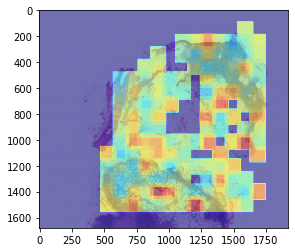

In [63]:
# MODEL HEATMAP
plt.imshow(slide_images[4])
plt.imshow(map_mask, cmap='jet', alpha=0.5)
gc.collect()

2670

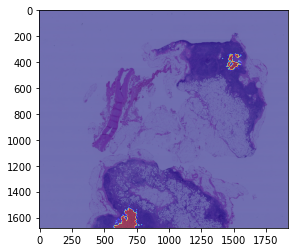

In [64]:
# VERSUS ACTUAL
plt.imshow(slide_images[4])
plt.imshow(mask_images[4], cmap='jet', alpha=0.5)
gc.collect()

In [65]:
# SAME PROCESS FOR SECOND IMAGE
contar = 0
patch_to_pixels = patches_to_pixels_list[1]
map_list = map_lists[5]
map_mask = map_masks[5]

for image, answer in hm_ds_2:
  for prediction, answer in zip(model.predict(x=image), answer):
    ctr_of_int = hm_df_2.loc[contar, 'image_center']
    list_of_pix = patch_to_pixels[ctr_of_int]
    contar += 1
    for pixel in list_of_pix:
      
      map_list[pixel[0]][pixel[1]].append(prediction[1])

gc.collect()

1/1 [==============================] - 1s 1s/step


5756

In [66]:
for i in range(len(map_list)):
  for key, value in map_list[i].items():
    if len(map_list[i][key]) == 0: 
      map_list[i][key] = 0
    else:
      map_list[i][key] = np.mean(value) #THIS GIVES AVERAGE PREDICTION FOR EACH PIXEL; EACH PREDICTION IS FOR AN ENTIRE PATCH
gc.collect()

0

In [67]:
for i in range(map_mask.shape[0]):
  for j in range(map_mask.shape[1]):
    map_mask[i][j] += (map_list[i][j] * 255) #RESCALE BACK TO 255 FOR PIXEL VALUES
gc.collect()

0

4

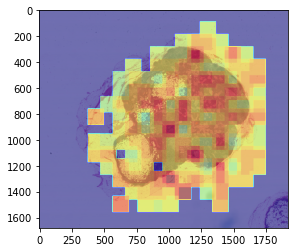

In [68]:
plt.imshow(slide_images[5])
plt.imshow(map_mask, cmap='jet', alpha=0.5)
gc.collect()

2670

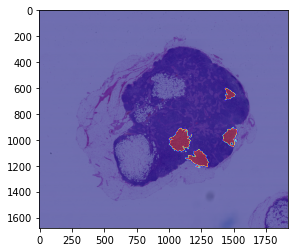

In [69]:
plt.imshow(slide_images[5])
plt.imshow(mask_images[5], cmap='jet', alpha=0.5)
gc.collect()

In [70]:
# REPEATING FOR DIFFERENT ZOOM LEVEL
contar = 0
patch_to_pixels = patches_to_pixels_list[2]
map_list = zoom_in_map_lists[4]
map_mask = zoom_in_map_masks[4]

for image, answer in hm_ds_3:
  for prediction, answer in zip(model.predict(x=image), answer):
    ctr_of_int = hm_df_3.loc[contar, 'image_center']
    list_of_pix = patch_to_pixels[ctr_of_int]
    contar += 1

    for pixel in list_of_pix:
      
      map_list[pixel[0]][pixel[1]].append(prediction[1])

gc.collect()

1/1 [==============================] - 1s 1s/step


5780

In [71]:
for i in range(len(map_list)):
  for key, value in map_list[i].items():
    if len(map_list[i][key]) == 0: 
      map_list[i][key] = 0
    else:
      map_list[i][key] = np.mean(value) #THIS GIVES AVERAGE PREDICTION FOR EACH PIXEL; EACH PREDICTION IS FOR AN ENTIRE PATCH
gc.collect()

0

In [72]:
for i in range(map_mask.shape[0]):
  for j in range(map_mask.shape[1]):
    map_mask[i][j] += (map_list[i][j] * 255) #RESCALE BACK TO 255 FOR PIXEL VALUES
gc.collect()

0

2496

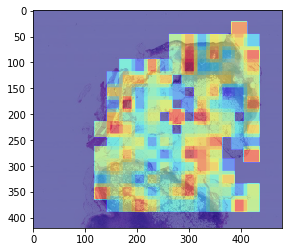

In [76]:
plt.imshow(zoom_in_images[4])
plt.imshow(map_mask, cmap='jet', alpha=0.5)
gc.collect()

2496

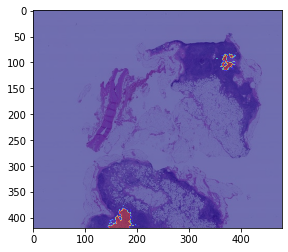

In [75]:
plt.imshow(zoom_in_images[4])
plt.imshow(zoom_in_mask_images[4], cmap='jet', alpha=0.5)
gc.collect()

In [77]:
contar = 0
patch_to_pixels = patches_to_pixels_list[3]
map_list = zoom_in_map_lists[5]
map_mask = zoom_in_map_masks[5]

for image, answer in hm_ds_4:
  for prediction, answer in zip(model.predict(x=image), answer):
    ctr_of_int = hm_df_4.loc[contar, 'image_center']
    list_of_pix = patch_to_pixels[ctr_of_int]
    contar += 1
    for pixel in list_of_pix:
      
      map_list[pixel[0]][pixel[1]].append(prediction[1])

gc.collect()

1/1 [==============================] - 2s 2s/step


3151

In [78]:
for i in range(len(map_list)):
  for key, value in map_list[i].items():
    if len(map_list[i][key]) == 0: 
      map_list[i][key] = 0
    else:
      map_list[i][key] = np.mean(value) #THIS GIVES AVERAGE PREDICTION FOR EACH PIXEL; EACH PREDICTION IS FOR AN ENTIRE PATCH
gc.collect()

0

In [79]:
for i in range(map_mask.shape[0]):
  for j in range(map_mask.shape[1]):
    map_mask[i][j] += (map_list[i][j] * 255) #RESCALE BACK TO 255 FOR PIXEL VALUES
gc.collect()

0

4

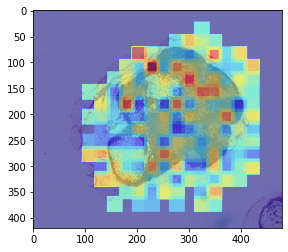

In [80]:
plt.imshow(zoom_in_images[5])
plt.imshow(map_mask, cmap='jet', alpha=0.5)
gc.collect()

2496

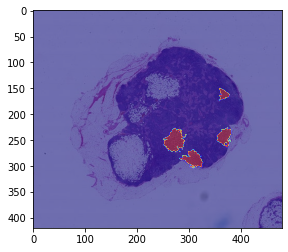

In [81]:
plt.imshow(zoom_in_images[5])
plt.imshow(zoom_in_mask_images[5], cmap='jet', alpha=0.5)
gc.collect()

So, while this did not render a fully usable model (this was not the expectation for the project given the dataset size limitations), we do have an end-end infrastructure built capable of using multiple zoom levels and augmenting data to increase sample size; further, while it is not performant on test data we did make progress on the training dataset, beating our baselines. Next steps would likely focus on increasing sample size to pursue better test performance.